In [ ]:
import pandas as pd

# Load the dataset
df = pd.read_csv(r'/content/Darknet.csv')

# Combine label1 and label2 into a single column 'label'
df['label'] = df['Label1'].astype(str) + '_' + df['Label2'].astype(str)

# Save the modified dataset
df.to_csv(r'/content/Darknet_modified.csv', index=False)

# Return the unique values from the 'label' column
unique_labels = df['label'].unique()
print("Unique Labels:", unique_labels)


Unique Labels: ['Non-Tor_AUDIO-STREAMING' 'Non-Tor_Chat' 'Non-Tor_Audio-Streaming'
 'Non-Tor_Browsing' 'Non-Tor_Email' 'Non-Tor_File-Transfer'
 'Non-Tor_File-transfer' 'Non-Tor_P2P' 'Non-Tor_Video-Streaming'
 'NonVPN_Chat' 'NonVPN_Audio-Streaming' 'NonVPN_Email'
 'NonVPN_File-Transfer' 'NonVPN_Video-Streaming' 'NonVPN_File-transfer'
 'NonVPN_Video-streaming' 'NonVPN_VOIP' 'Tor_Audio-Streaming'
 'Tor_Browsing' 'Tor_Chat' 'Tor_File-Transfer' 'Tor_Email' 'Tor_P2P'
 'Tor_Video-Streaming' 'Tor_VOIP' 'VPN_File-Transfer' 'VPN_Chat'
 'VPN_Audio-Streaming' 'VPN_Email' 'VPN_Video-Streaming' 'VPN_VOIP']


In [ ]:
import pandas as pd



# Define the categories for secured and unsecured traffic
secured_traffic = [
    'Tor_Audio-Streaming', 'Tor_Browsing', 'Tor_Chat', 'Tor_File-Transfer', 'Tor_Email', 'Tor_P2P',
    'Tor_Video-Streaming', 'Tor_VOIP', 'VPN_File-Transfer', 'VPN_Chat', 'VPN_Audio-Streaming',
    'VPN_Email', 'VPN_Video-Streaming', 'VPN_VOIP'
]

unsecured_traffic = [
    'Non-Tor_AUDIO-STREAMING', 'Non-Tor_Chat', 'Non-Tor_Audio-Streaming', 'Non-Tor_Browsing',
    'Non-Tor_Email', 'Non-Tor_File-Transfer', 'Non-Tor_File-transfer', 'Non-Tor_P2P',
    'Non-Tor_Video-Streaming', 'NonVPN_Chat', 'NonVPN_Audio-Streaming', 'NonVPN_Email',
    'NonVPN_File-Transfer', 'NonVPN_Video-Streaming', 'NonVPN_File-transfer', 'NonVPN_Video-streaming',
    'NonVPN_VOIP'
]

# Assign 0 for secured traffic (Tor and VPN), and 1 for unsecured traffic (Non-Tor and NonVPN)
df['security_status'] = df['label'].apply(lambda x: 0 if x in secured_traffic else 1)

# Save the modified dataset
df.to_csv(r'/content/Darknet_modified.csv', index=False)

# Return the unique values from the 'security_status' column
unique_labels = df['security_status'].unique()
print("Unique Labels for Security Status:", unique_labels)


Unique Labels for Security Status: [1 0]


In [ ]:
# Shuffle the dataset
df = df.sample(frac=1).reset_index(drop=True)

# Save the modified dataset
df.to_csv(r'/content/Darknet_modified.csv', index=False)

# Random forst

In [ ]:
!pip install lime


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=8dc8f7d191e6c82460b94596a637eeb6b8e4c0e4691c3bf4431ecbd01ee5dfe7
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import pickle
import os
import numpy as np
from lime.lime_tabular import LimeTabularExplainer

# Load the dataset
file_path = r'/content/Darknet_modified.csv'
df = pd.read_csv(file_path)

# Select features and target variable
features = [
    'Flow Duration', 'Total Fwd Packet', 'Total Bwd packets', 'Total Length of Fwd Packet',
    'Total Length of Bwd Packet', 'Fwd Packet Length Max', 'Fwd Packet Length Min',
    'Fwd Packet Length Mean', 'Fwd Packet Length Std', 'Bwd Packet Length Max', 'Bwd Packet Length Min',
    'Bwd Packet Length Mean', 'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow Packets/s', 'Flow IAT Mean',
    'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min', 'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std',
    'Fwd IAT Max', 'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std', 'Bwd IAT Max', 'Bwd IAT Min',
    'Fwd PSH Flags', 'Bwd PSH Flags', 'Fwd URG Flags', 'Bwd URG Flags', 'Fwd Header Length',
    'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s', 'Packet Length Min', 'Packet Length Max',
    'Packet Length Mean', 'Packet Length Std', 'Packet Length Variance', 'FIN Flag Count', 'SYN Flag Count',
    'RST Flag Count', 'PSH Flag Count', 'ACK Flag Count', 'URG Flag Count', 'CWE Flag Count', 'ECE Flag Count',
    'Down/Up Ratio', 'Average Packet Size', 'Fwd Segment Size Avg', 'Bwd Segment Size Avg', 'Fwd Bytes/Bulk Avg',
    'Fwd Packet/Bulk Avg', 'Fwd Bulk Rate Avg', 'Bwd Bytes/Bulk Avg', 'Bwd Packet/Bulk Avg', 'Bwd Bulk Rate Avg',
    'Subflow Fwd Packets', 'Subflow Fwd Bytes', 'Subflow Bwd Packets', 'Subflow Bwd Bytes', 'FWD Init Win Bytes',
    'Bwd Init Win Bytes', 'Fwd Act Data Pkts', 'Fwd Seg Size Min', 'Active Mean', 'Active Std', 'Active Max',
    'Active Min', 'Idle Mean', 'Idle Std', 'Idle Max', 'Idle Min'
]
target = 'security_status'

# Step 1: Preprocess the Data
data = df[features]
target_data = df[target]

# Handle missing values: Fill NaNs with the mean of each column
data.fillna(data.mean(), inplace=True)

# Replace infinite values with NaN and then handle NaNs again
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.fillna(data.mean(), inplace=True)  # Refill NaNs after replacing infinities

# Step 2: Standardize the data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

# Step 3: Reduce Dimensionality using PCA
pca = PCA(n_components=50)
data_pca = pca.fit_transform(data_scaled)

# Step 4: Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data_pca, target_data, test_size=0.2, random_state=42)

# Step 5: Train the Random Forest Classifier
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Step 6: Model Evaluation
# Classification Report
y_pred = rf_model.predict(X_test)
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion Matrix
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

# Step 7: Model Size and Parameters
# Save the model as a pickle file and check its size
with open('rf_model.pkl', 'wb') as model_file:
    pickle.dump(rf_model, model_file)

model_size = os.path.getsize('rf_model.pkl') / (1024 * 1024)  # size in MB
print(f"Model size: {model_size:.2f} MB")

# Calculate the number of parameters:
# Random Forest parameters include the number of trees and the number of features
num_parameters = len(rf_model.estimators_) * len(features)  # number of trees * number of features
print(f"Number of Parameters: {num_parameters}")

# Step 8: Model Interpretation with LIME
# Initialize LimeTabularExplainer for LIME
explainer = LimeTabularExplainer(X_train, training_labels=y_train, feature_names=features, class_names=['0', '1'], mode='classification')

# Example: Explain a prediction for the first instance in the test set
i = 0  # First test instance
exp = explainer.explain_instance(X_test[i], rf_model.predict_proba, num_features=10)

# Visualize the explanation
exp.show_in_notebook()


<ipython-input-5-900a0cd9c760>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.fillna(data.mean(), inplace=True)
<ipython-input-5-900a0cd9c760>:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.replace([np.inf, -np.inf], np.nan, inplace=True)
<ipython-input-5-900a0cd9c760>:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.fillna(data.mean(), inplace=True)  # Refill NaNs after replacing infinities


Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.92      0.93      4821
           1       0.99      0.99      0.99     26903

    accuracy                           0.98     31724
   macro avg       0.96      0.95      0.96     31724
weighted avg       0.98      0.98      0.98     31724

Confusion Matrix:
[[ 4441   380]
 [  309 26594]]
Model size: 35.44 MB
Number of Parameters: 7600


# Decision tree

In [ ]:
!pip install lime scikit-learn pandas numpy


In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.tree import DecisionTreeClassifier  # Importing DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import pickle
import os
import numpy as np
from lime.lime_tabular import LimeTabularExplainer

# Load the dataset
file_path = r'/content/Darknet_modified.csv'
df = pd.read_csv(file_path)

# Select features and target variable
features = [
    'Flow Duration', 'Total Fwd Packet', 'Total Bwd packets', 'Total Length of Fwd Packet',
    'Total Length of Bwd Packet', 'Fwd Packet Length Max', 'Fwd Packet Length Min',
    'Fwd Packet Length Mean', 'Fwd Packet Length Std', 'Bwd Packet Length Max', 'Bwd Packet Length Min',
    'Bwd Packet Length Mean', 'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow Packets/s', 'Flow IAT Mean',
    'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min', 'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std',
    'Fwd IAT Max', 'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std', 'Bwd IAT Max', 'Bwd IAT Min',
    'Fwd PSH Flags', 'Bwd PSH Flags', 'Fwd URG Flags', 'Bwd URG Flags', 'Fwd Header Length',
    'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s', 'Packet Length Min', 'Packet Length Max',
    'Packet Length Mean', 'Packet Length Std', 'Packet Length Variance', 'FIN Flag Count', 'SYN Flag Count',
    'RST Flag Count', 'PSH Flag Count', 'ACK Flag Count', 'URG Flag Count', 'CWE Flag Count', 'ECE Flag Count',
    'Down/Up Ratio', 'Average Packet Size', 'Fwd Segment Size Avg', 'Bwd Segment Size Avg', 'Fwd Bytes/Bulk Avg',
    'Fwd Packet/Bulk Avg', 'Fwd Bulk Rate Avg', 'Bwd Bytes/Bulk Avg', 'Bwd Packet/Bulk Avg', 'Bwd Bulk Rate Avg',
    'Subflow Fwd Packets', 'Subflow Fwd Bytes', 'Subflow Bwd Packets', 'Subflow Bwd Bytes', 'FWD Init Win Bytes',
    'Bwd Init Win Bytes', 'Fwd Act Data Pkts', 'Fwd Seg Size Min', 'Active Mean', 'Active Std', 'Active Max',
    'Active Min', 'Idle Mean', 'Idle Std', 'Idle Max', 'Idle Min'
]
target = 'security_status'

# Step 1: Preprocess the Data
data = df[features]
target_data = df[target]

# Handle missing values: Fill NaNs with the mean of each column
data.fillna(data.mean(), inplace=True)

# Replace infinite values with NaN and then handle NaNs again
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.fillna(data.mean(), inplace=True)  # Refill NaNs after replacing infinities

# Step 2: Standardize the data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

# Step 3: Reduce Dimensionality using PCA with explained variance ratio threshold
pca = PCA(n_components=0.95)  # Retain 95% variance, adapt the number of components dynamically
data_pca = pca.fit_transform(data_scaled)

# Step 4: Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data_pca, target_data, test_size=0.2, random_state=42)

# Step 5: Train the Decision Tree Classifier
dt_model = DecisionTreeClassifier(random_state=42)  # Using DecisionTreeClassifier instead of SVM
dt_model.fit(X_train, y_train)

# Step 6: Model Evaluation
# Classification Report
y_pred = dt_model.predict(X_test)
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion Matrix
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

# Step 7: Model Size and Parameters
# Save the model as a pickle file and check its size
with open('dt_model.pkl', 'wb') as model_file:
    pickle.dump(dt_model, model_file)

model_size = os.path.getsize('dt_model.pkl') / (1024 * 1024)  # size in MB
print(f"Model size: {model_size:.2f} MB")

# Calculate the number of parameters (number of leaf nodes in the tree):
num_leaf_nodes = dt_model.get_n_leaves()
print(f"Number of Leaf Nodes: {num_leaf_nodes}")

# Step 8: Model Interpretation with LIME (optimized to explain fewer instances)
# Initialize LimeTabularExplainer for LIME
explainer = LimeTabularExplainer(X_train, training_labels=y_train, feature_names=features, class_names=['0', '1'], mode='classification')

# Example: Explain a prediction for a random test instance (limit the number of instances)
i = 100  # Explain an instance further in the test set
exp = explainer.explain_instance(X_test[i], dt_model.predict_proba, num_features=10)

# Visualize the explanation
exp.show_in_notebook()


<ipython-input-7-55fde89f1be9>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.fillna(data.mean(), inplace=True)
<ipython-input-7-55fde89f1be9>:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.replace([np.inf, -np.inf], np.nan, inplace=True)
<ipython-input-7-55fde89f1be9>:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.fillna(data.mean(), inplace=True)  # Refill NaNs after replacing infinities


Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.91      0.91      4821
           1       0.98      0.98      0.98     26903

    accuracy                           0.97     31724
   macro avg       0.95      0.95      0.95     31724
weighted avg       0.97      0.97      0.97     31724

Confusion Matrix:
[[ 4395   426]
 [  448 26455]]
Model size: 0.46 MB
Number of Leaf Nodes: 3039


# XG boost

In [ ]:
!pip install lime xgboost scikit-learn pandas numpy


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report, confusion_matrix
import pickle
import os
from lime.lime_tabular import LimeTabularExplainer
import xgboost as xgb

# Load the dataset
file_path = r'/content/Darknet_modified.csv'
df = pd.read_csv(file_path)

# Select features and target variable
features = [
    'Flow Duration', 'Total Fwd Packet', 'Total Bwd packets', 'Total Length of Fwd Packet',
    'Total Length of Bwd Packet', 'Fwd Packet Length Max', 'Fwd Packet Length Min',
    'Fwd Packet Length Mean', 'Fwd Packet Length Std', 'Bwd Packet Length Max', 'Bwd Packet Length Min',
    'Bwd Packet Length Mean', 'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow Packets/s', 'Flow IAT Mean',
    'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min', 'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std',
    'Fwd IAT Max', 'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std', 'Bwd IAT Max', 'Bwd IAT Min',
    'Fwd PSH Flags', 'Bwd PSH Flags', 'Fwd URG Flags', 'Bwd URG Flags', 'Fwd Header Length',
    'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s', 'Packet Length Min', 'Packet Length Max',
    'Packet Length Mean', 'Packet Length Std', 'Packet Length Variance', 'FIN Flag Count', 'SYN Flag Count',
    'RST Flag Count', 'PSH Flag Count', 'ACK Flag Count', 'URG Flag Count', 'CWE Flag Count', 'ECE Flag Count',
    'Down/Up Ratio', 'Average Packet Size', 'Fwd Segment Size Avg', 'Bwd Segment Size Avg', 'Fwd Bytes/Bulk Avg',
    'Fwd Packet/Bulk Avg', 'Fwd Bulk Rate Avg', 'Bwd Bytes/Bulk Avg', 'Bwd Packet/Bulk Avg', 'Bwd Bulk Rate Avg',
    'Subflow Fwd Packets', 'Subflow Fwd Bytes', 'Subflow Bwd Packets', 'Subflow Bwd Bytes', 'FWD Init Win Bytes',
    'Bwd Init Win Bytes', 'Fwd Act Data Pkts', 'Fwd Seg Size Min', 'Active Mean', 'Active Std', 'Active Max',
    'Active Min', 'Idle Mean', 'Idle Std', 'Idle Max', 'Idle Min'
]
target = 'security_status'

# Step 1: Preprocess the Data
data = df[features]
target_data = df[target]

# Handle missing values: Fill NaNs with the mean of each column
data.fillna(data.mean(), inplace=True)

# Replace infinite values with NaN and then handle NaNs again
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.fillna(data.mean(), inplace=True)

# Step 2: Standardize the data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

# Step 3: Reduce Dimensionality using PCA
pca = PCA(n_components=50)
data_pca = pca.fit_transform(data_scaled)

# Step 4: Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data_pca, target_data, test_size=0.2, random_state=42)

# Step 5: Train the XGBoost Model
xgb_model = xgb.XGBClassifier(eval_metric='mlogloss', use_label_encoder=False, random_state=42)
xgb_model.fit(X_train, y_train)

# Step 6: Model Evaluation
# Classification Report
y_pred = xgb_model.predict(X_test)
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion Matrix
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

# Step 7: Model Size and Parameters
# Save the model as a pickle file and check its size
with open('xgb_model.pkl', 'wb') as model_file:
    pickle.dump(xgb_model, model_file)

model_size = os.path.getsize('xgb_model.pkl') / (1024 * 1024)  # size in MB
print(f"Model size: {model_size:.2f} MB")

# Number of parameters in XGBoost Model
num_parameters = 0
booster = xgb_model.get_booster()

# Iterate through each tree in the booster and count the parameters (weights)
for tree in booster.get_dump():
    tree_lines = tree.split('\n')
    num_parameters += len([line for line in tree_lines if 'split' in line])  # count splits

print(f"Number of Parameters: {num_parameters}")

# Step 8: Model Interpretation with LIME
# Initialize LimeTabularExplainer for LIME
explainer = LimeTabularExplainer(X_train, training_labels=y_train, feature_names=features, class_names=['0', '1'], mode='classification')

# Example: Explain a prediction for the first instance in the test set
i = 0  # First test instance
exp = explainer.explain_instance(X_test[i], xgb_model.predict_proba, num_features=10)

# Visualize the explanation
exp.show_in_notebook()


<ipython-input-9-3f3b4c348fd1>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.fillna(data.mean(), inplace=True)
<ipython-input-9-3f3b4c348fd1>:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.replace([np.inf, -np.inf], np.nan, inplace=True)
<ipython-input-9-3f3b4c348fd1>:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.fillna(data.mean(), inplace=True)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: Use

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.91      0.93      4821
           1       0.98      0.99      0.99     26903

    accuracy                           0.98     31724
   macro avg       0.96      0.95      0.96     31724
weighted avg       0.98      0.98      0.98     31724

Confusion Matrix:
[[ 4404   417]
 [  294 26609]]
Model size: 0.37 MB
Number of Parameters: 0


# Linear Regression

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.metrics import classification_report, confusion_matrix
import pickle
import os
from sklearn.linear_model import LogisticRegression
from lime.lime_tabular import LimeTabularExplainer

# Load the dataset
file_path = r'/content/Darknet_modified.csv'
df = pd.read_csv(file_path)

# Select features and target variable
features = [
    'Flow Duration', 'Total Fwd Packet', 'Total Bwd packets', 'Total Length of Fwd Packet',
    'Total Length of Bwd Packet', 'Fwd Packet Length Max', 'Fwd Packet Length Min',
    'Fwd Packet Length Mean', 'Fwd Packet Length Std', 'Bwd Packet Length Max', 'Bwd Packet Length Min',
    'Bwd Packet Length Mean', 'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow Packets/s', 'Flow IAT Mean',
    'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min', 'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std',
    'Fwd IAT Max', 'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std', 'Bwd IAT Max', 'Bwd IAT Min',
    'Fwd PSH Flags', 'Bwd PSH Flags', 'Fwd URG Flags', 'Bwd URG Flags', 'Fwd Header Length',
    'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s', 'Packet Length Min', 'Packet Length Max',
    'Packet Length Mean', 'Packet Length Std', 'Packet Length Variance', 'FIN Flag Count', 'SYN Flag Count',
    'RST Flag Count', 'PSH Flag Count', 'ACK Flag Count', 'URG Flag Count', 'CWE Flag Count', 'ECE Flag Count',
    'Down/Up Ratio', 'Average Packet Size', 'Fwd Segment Size Avg', 'Bwd Segment Size Avg', 'Fwd Bytes/Bulk Avg',
    'Fwd Packet/Bulk Avg', 'Fwd Bulk Rate Avg', 'Bwd Bytes/Bulk Avg', 'Bwd Packet/Bulk Avg', 'Bwd Bulk Rate Avg',
    'Subflow Fwd Packets', 'Subflow Fwd Bytes', 'Subflow Bwd Packets', 'Subflow Bwd Bytes', 'FWD Init Win Bytes',
    'Bwd Init Win Bytes', 'Fwd Act Data Pkts', 'Fwd Seg Size Min', 'Active Mean', 'Active Std', 'Active Max',
    'Active Min', 'Idle Mean', 'Idle Std', 'Idle Max', 'Idle Min'
]
target = 'security_status'

# Step 1: Preprocess the Data
data = df[features]
target_data = df[target]

# Handle missing values: Fill NaNs with the mean of each column
data.fillna(data.mean(), inplace=True)

# Replace infinite values with NaN and then handle NaNs again
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.fillna(data.mean(), inplace=True)

# Step 2: Standardize the data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

# Step 3: Reduce Dimensionality using PCA
pca = PCA(n_components=50)
data_pca = pca.fit_transform(data_scaled)

# Step 4: Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data_pca, target_data, test_size=0.2, random_state=42)

# Step 5: Train the Logistic Regression Model (use Logistic Regression for binary classification)
log_reg_model = LogisticRegression(max_iter=1000)
log_reg_model.fit(X_train, y_train)

# Step 6: Model Evaluation
# Prediction (with probability scores)
y_pred_prob = log_reg_model.predict_proba(X_test)[:, 1]  # Get probability for class 1

# Convert probabilities to binary predictions (using 0.5 threshold)
y_pred_binary = (y_pred_prob > 0.5).astype(int)

# Classification Report
print("Classification Report:")
print(classification_report(y_test, y_pred_binary))

# Confusion Matrix
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_binary))

# Step 7: Model Size and Parameters
# Save the model as a pickle file and check its size
with open('log_reg_model.pkl', 'wb') as model_file:
    pickle.dump(log_reg_model, model_file)

model_size = os.path.getsize('log_reg_model.pkl') / (1024 * 1024)  # size in MB
print(f"Model size: {model_size:.2f} MB")

# Number of parameters in Logistic Regression Model (coefficients + intercept)
num_parameters = X_train.shape[1] + 1  # coefficients + intercept
print(f"Number of Parameters: {num_parameters}")

# Step 8: Model Interpretation with LIME
# Initialize LimeTabularExplainer for LIME
explainer = LimeTabularExplainer(X_train, training_labels=y_train, feature_names=features, class_names=['0', '1'], mode='classification')

# Example: Explain a prediction for the first instance in the test set
i = 0  # First test instance
exp = explainer.explain_instance(X_test[i], log_reg_model.predict_proba, num_features=10)

# Visualize the explanation
exp.show_in_notebook()

<ipython-input-10-8b7de6ea7fd2>:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.fillna(data.mean(), inplace=True)
<ipython-input-10-8b7de6ea7fd2>:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.replace([np.inf, -np.inf], np.nan, inplace=True)
<ipython-input-10-8b7de6ea7fd2>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.fillna(data.mean(), inplace=True)


Classification Report:
              precision    recall  f1-score   support

           0       0.80      0.64      0.71      4821
           1       0.94      0.97      0.95     26903

    accuracy                           0.92     31724
   macro avg       0.87      0.81      0.83     31724
weighted avg       0.92      0.92      0.92     31724

Confusion Matrix:
[[ 3083  1738]
 [  750 26153]]
Model size: 0.00 MB
Number of Parameters: 51


# logistics regression

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
import pickle
import os
import lime
import lime.lime_tabular

# Load the dataset
file_path = r'/content/Darknet_modified.csv'
data = pd.read_csv(file_path)

# Assume that the target column is named 'security_status' (Change if different)
target_column = 'security_status'

# Split into features (X) and target (y)
X = data.drop(columns=[target_column])
y = data[target_column]

# Identify and drop non-numeric columns except target column
non_numeric_columns = X.select_dtypes(exclude=[np.number]).columns
X = X.drop(columns=non_numeric_columns)

# Handle missing values and infinite values
numeric_columns = X.select_dtypes(include=[np.number]).columns
X[numeric_columns] = X[numeric_columns].replace([np.inf, -np.inf], np.nan)
X[numeric_columns] = X[numeric_columns].fillna(X[numeric_columns].mean())

# Convert the target variable to binary (if necessary)
if y.dtype == 'object':
    y = pd.get_dummies(y, drop_first=True)

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Dimensionality Reduction using PCA
pca = PCA(n_components=min(50, X_scaled.shape[1]))
X_reduced = pca.fit_transform(X_scaled)

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_reduced, y, test_size=0.2, random_state=42)

# Train Logistic Regression model
log_reg_model = LogisticRegression(max_iter=1000)
log_reg_model.fit(X_train, y_train)

# Model Evaluation
# Prediction (with probability scores)
y_pred_prob = log_reg_model.predict_proba(X_test)[:, 1]  # Get probability for class 1

# Convert probabilities to binary predictions (using 0.5 threshold)
y_pred_binary = (y_pred_prob > 0.5).astype(int)

# Classification Report
print("Classification Report:")
print(classification_report(y_test, y_pred_binary))

# Confusion Matrix
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_binary))

# Model Size and Parameters
# Save the model as a pickle file and check its size
with open('log_reg_model.pkl', 'wb') as model_file:
    pickle.dump(log_reg_model, model_file)

model_size = os.path.getsize('log_reg_model.pkl') / (1024 * 1024)  # size in MB
print(f"Model size: {model_size:.2f} MB")

# Number of parameters in Logistic Regression Model (coefficients + intercept)
num_parameters = X_train.shape[1] + 1  # coefficients + intercept
print(f"Number of Parameters: {num_parameters}")

# LIME Explanation
# Initialize LimeTabularExplainer for LIME
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, training_labels=y_train,
                                                   feature_names=[f"PC{i+1}" for i in range(X_train.shape[1])],
                                                   class_names=['0', '1'], mode='classification')

# Example: Explain a prediction for the first instance in the test set
i = 0  # First test instance
exp = explainer.explain_instance(X_test[i], log_reg_model.predict_proba, num_features=10)

# Visualize the explanation
exp.show_in_notebook()


Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.73      0.77      4821
           1       0.95      0.97      0.96     26903

    accuracy                           0.93     31724
   macro avg       0.88      0.85      0.87     31724
weighted avg       0.93      0.93      0.93     31724

Confusion Matrix:
[[ 3536  1285]
 [  820 26083]]
Model size: 0.00 MB
Number of Parameters: 51


#adaboost

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, accuracy_score
from sklearn.impute import SimpleImputer
import pickle
import os
import lime
import lime.lime_tabular

# Load the dataset
file_path = r'/content/Darknet_modified.csv'
data = pd.read_csv(file_path)

# Define feature columns and target column
feature_columns = [
    'Flow Duration', 'Total Fwd Packet', 'Total Bwd packets', 'Total Length of Fwd Packet',
    'Total Length of Bwd Packet', 'Fwd Packet Length Max', 'Fwd Packet Length Min',
    'Fwd Packet Length Mean', 'Fwd Packet Length Std', 'Bwd Packet Length Max',
    'Bwd Packet Length Min', 'Bwd Packet Length Mean', 'Bwd Packet Length Std',
    'Flow Bytes/s', 'Flow Packets/s', 'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max',
    'Flow IAT Min', 'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max',
    'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std', 'Bwd IAT Max',
    'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags', 'Fwd URG Flags', 'Bwd URG Flags',
    'Fwd Header Length', 'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s',
    'Packet Length Min', 'Packet Length Max', 'Packet Length Mean', 'Packet Length Std',
    'Packet Length Variance', 'FIN Flag Count', 'SYN Flag Count', 'RST Flag Count',
    'PSH Flag Count', 'ACK Flag Count', 'URG Flag Count', 'CWE Flag Count',
    'ECE Flag Count', 'Down/Up Ratio', 'Average Packet Size', 'Fwd Segment Size Avg',
    'Bwd Segment Size Avg', 'Fwd Bytes/Bulk Avg', 'Fwd Packet/Bulk Avg', 'Fwd Bulk Rate Avg',
    'Bwd Bytes/Bulk Avg', 'Bwd Packet/Bulk Avg', 'Bwd Bulk Rate Avg', 'Subflow Fwd Packets',
    'Subflow Fwd Bytes', 'Subflow Bwd Packets', 'Subflow Bwd Bytes', 'FWD Init Win Bytes',
    'Bwd Init Win Bytes', 'Fwd Act Data Pkts', 'Fwd Seg Size Min', 'Active Mean',
    'Active Std', 'Active Max', 'Active Min', 'Idle Mean', 'Idle Std', 'Idle Max', 'Idle Min'
]

# Target column
target_column = 'security_status'

# Split into features (X) and target (y)
X = data[feature_columns]
y = data[target_column]

# Handle missing and infinite values
X.replace([np.inf, -np.inf], np.nan, inplace=True)  # Replace infinities with NaN
imputer = SimpleImputer(strategy='mean')
X = imputer.fit_transform(X)

# Check for any NaN values after imputation
if np.any(np.isnan(X)):
    raise ValueError("There are still NaN values in the data after imputation.")

# Convert the target variable to binary (if necessary)
if y.dtype == 'object':
    from sklearn.preprocessing import LabelEncoder
    le = LabelEncoder()
    y = le.fit_transform(y)

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Dimensionality Reduction using PCA
pca = PCA(n_components=50)
X_reduced = pca.fit_transform(X_scaled)

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_reduced, y, test_size=0.2, random_state=42)

# Train AdaBoost Classifier
adaboost_model = AdaBoostClassifier(n_estimators=100, random_state=42)
adaboost_model.fit(X_train, y_train)

# Model Evaluation
# Prediction (with probability scores)
y_pred_prob = adaboost_model.predict_proba(X_test)[:, 1]  # Get probability for class 1

# Convert probabilities to binary predictions (using 0.5 threshold)
y_pred_binary = (y_pred_prob > 0.5).astype(int)

# Classification Report
print("Classification Report:")
print(classification_report(y_test, y_pred_binary))

# Confusion Matrix
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_binary))

# Additional Metrics
print(f"ROC AUC: {roc_auc_score(y_test, y_pred_prob):.2f}")
print(f"Accuracy: {accuracy_score(y_test, y_pred_binary):.2f}")

# Model Size and Parameters
# Save the model as a pickle file and check its size
with open('adaboost_model.pkl', 'wb') as model_file:
    pickle.dump(adaboost_model, model_file)

model_size = os.path.getsize('adaboost_model.pkl') / (1024 * 1024)  # size in MB
print(f"Model size: {model_size:.2f} MB")

# Number of parameters in AdaBoost (each estimator contributes to the model size)
num_parameters = sum([estimator.n_features_in_ for estimator in adaboost_model.estimators_])
print(f"Number of Parameters: {num_parameters}")

# LIME Explanation
# Initialize LimeTabularExplainer for LIME
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, training_labels=y_train,
                                                   feature_names=[f"PC{i+1}" for i in range(X_train.shape[1])],
                                                   class_names=['0', '1'], mode='classification')

# Example: Explain a prediction for the first instance in the test set
i = 0  # First test instance
exp = explainer.explain_instance(X_test[i], adaboost_model.predict_proba, num_features=10)

# Save the explanation as an HTML file
exp.save_to_file('lime_explanation.html')

# Visualize the explanation
exp.show_in_notebook()

<ipython-input-12-f8efd1676f60>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X.replace([np.inf, -np.inf], np.nan, inplace=True)  # Replace infinities with NaN


Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.78      0.80      4821
           1       0.96      0.97      0.96     26903

    accuracy                           0.94     31724
   macro avg       0.89      0.88      0.88     31724
weighted avg       0.94      0.94      0.94     31724

Confusion Matrix:
[[ 3773  1048]
 [  843 26060]]
ROC AUC: 0.97
Accuracy: 0.94
Model size: 0.05 MB
Number of Parameters: 5000


# KNN

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, accuracy_score
from sklearn.impute import SimpleImputer
import pickle
import os
import lime
import lime.lime_tabular

# Load the dataset
file_path = r'/content/Darknet_modified.csv'
data = pd.read_csv(file_path)

# Define feature columns and target column
feature_columns = [
    'Flow Duration', 'Total Fwd Packet', 'Total Bwd packets', 'Total Length of Fwd Packet',
    'Total Length of Bwd Packet', 'Fwd Packet Length Max', 'Fwd Packet Length Min',
    'Fwd Packet Length Mean', 'Fwd Packet Length Std', 'Bwd Packet Length Max',
    'Bwd Packet Length Min', 'Bwd Packet Length Mean', 'Bwd Packet Length Std',
    'Flow Bytes/s', 'Flow Packets/s', 'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max',
    'Flow IAT Min', 'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max',
    'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std', 'Bwd IAT Max',
    'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags', 'Fwd URG Flags', 'Bwd URG Flags',
    'Fwd Header Length', 'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s',
    'Packet Length Min', 'Packet Length Max', 'Packet Length Mean', 'Packet Length Std',
    'Packet Length Variance', 'FIN Flag Count', 'SYN Flag Count', 'RST Flag Count',
    'PSH Flag Count', 'ACK Flag Count', 'URG Flag Count', 'CWE Flag Count',
    'ECE Flag Count', 'Down/Up Ratio', 'Average Packet Size', 'Fwd Segment Size Avg',
    'Bwd Segment Size Avg', 'Fwd Bytes/Bulk Avg', 'Fwd Packet/Bulk Avg', 'Fwd Bulk Rate Avg',
    'Bwd Bytes/Bulk Avg', 'Bwd Packet/Bulk Avg', 'Bwd Bulk Rate Avg', 'Subflow Fwd Packets',
    'Subflow Fwd Bytes', 'Subflow Bwd Packets', 'Subflow Bwd Bytes', 'FWD Init Win Bytes',
    'Bwd Init Win Bytes', 'Fwd Act Data Pkts', 'Fwd Seg Size Min', 'Active Mean',
    'Active Std', 'Active Max', 'Active Min', 'Idle Mean', 'Idle Std', 'Idle Max', 'Idle Min'
]

# Target column
target_column = 'security_status'

# Split into features (X) and target (y)
X = data[feature_columns]
y = data[target_column]

# Handle infinity and large values by replacing them with NaN
X.replace([np.inf, -np.inf], np.nan, inplace=True)

# Handle missing and infinite values using SimpleImputer
imputer = SimpleImputer(strategy='mean')
X = imputer.fit_transform(X)

# Convert the target variable to binary (if necessary)
if y.dtype == 'object':
    from sklearn.preprocessing import LabelEncoder
    le = LabelEncoder()
    y = le.fit_transform(y)

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Dimensionality Reduction using PCA
pca = PCA(n_components=50)
X_reduced = pca.fit_transform(X_scaled)

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_reduced, y, test_size=0.2, random_state=42)

# Train K-Nearest Neighbors Classifier
knn_model = KNeighborsClassifier(n_neighbors=5)
knn_model.fit(X_train, y_train)

# Model Evaluation
# Prediction (with probability scores)
y_pred_prob = knn_model.predict_proba(X_test)[:, 1]  # Get probability for class 1

# Convert probabilities to binary predictions (using 0.5 threshold)
y_pred_binary = (y_pred_prob > 0.5).astype(int)

# Classification Report
print("Classification Report:")
print(classification_report(y_test, y_pred_binary))

# Confusion Matrix
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_binary))

# Additional Metrics
print(f"ROC AUC: {roc_auc_score(y_test, y_pred_prob):.2f}")
print(f"Accuracy: {accuracy_score(y_test, y_pred_binary):.2f}")

# Model Size and Parameters
# Save the model as a pickle file and check its size
with open('knn_model.pkl', 'wb') as model_file:
    pickle.dump(knn_model, model_file)

model_size = os.path.getsize('knn_model.pkl') / (1024 * 1024)  # size in MB
print(f"Model size: {model_size:.2f} MB")

# LIME Explanation
# Initialize LimeTabularExplainer for LIME
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, training_labels=y_train,
                                                   feature_names=[f"PC{i+1}" for i in range(X_train.shape[1])],
                                                   class_names=['0', '1'], mode='classification')

# Example: Explain a prediction for the first instance in the test set
i = 0  # First test instance
exp = explainer.explain_instance(X_test[i], knn_model.predict_proba, num_features=10)

# Save the explanation as an HTML file
exp.save_to_file('lime_explanation_knn.html')


# Visualize the explanation
exp.show_in_notebook()


<ipython-input-13-3362a52ca977>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X.replace([np.inf, -np.inf], np.nan, inplace=True)


Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.91      0.92      4821
           1       0.98      0.99      0.99     26903

    accuracy                           0.98     31724
   macro avg       0.96      0.95      0.95     31724
weighted avg       0.98      0.98      0.98     31724

Confusion Matrix:
[[ 4389   432]
 [  345 26558]]
ROC AUC: 0.98
Accuracy: 0.98
Model size: 49.37 MB


# Deep learning
# CNN

In [ ]:
!pip install pandas numpy scikit-learn tensorflow lime matplotlib


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 8.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=1527a857fcbf42784caec77d077d0fdb30b5d851bd801272aa5beee89f919b3a
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, GlobalMaxPooling1D, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical

import lime
from lime.lime_tabular import LimeTabularExplainer
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('/content/Darknet_modified.csv')

# Check the columns in the dataset to ensure the correct target column
print("Available columns in the dataset:")
print(df.columns)

# Define feature columns explicitly
features = [
    'Flow Duration', 'Total Fwd Packet', 'Total Bwd packets', 'Total Length of Fwd Packet',
    'Total Length of Bwd Packet', 'Fwd Packet Length Max', 'Fwd Packet Length Min',
    'Fwd Packet Length Mean', 'Fwd Packet Length Std', 'Bwd Packet Length Max',
    'Bwd Packet Length Min', 'Bwd Packet Length Mean', 'Bwd Packet Length Std',
    'Flow Bytes/s', 'Flow Packets/s', 'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max',
    'Flow IAT Min', 'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max',
    'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std', 'Bwd IAT Max',
    'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags', 'Fwd URG Flags', 'Bwd URG Flags',
    'Fwd Header Length', 'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s',
    'Packet Length Min', 'Packet Length Max', 'Packet Length Mean', 'Packet Length Std',
    'Packet Length Variance', 'FIN Flag Count', 'SYN Flag Count', 'RST Flag Count',
    'PSH Flag Count', 'ACK Flag Count', 'URG Flag Count', 'CWE Flag Count',
    'ECE Flag Count', 'Down/Up Ratio', 'Average Packet Size', 'Fwd Segment Size Avg',
    'Bwd Segment Size Avg', 'Fwd Bytes/Bulk Avg', 'Fwd Packet/Bulk Avg', 'Fwd Bulk Rate Avg',
    'Bwd Bytes/Bulk Avg', 'Bwd Packet/Bulk Avg', 'Bwd Bulk Rate Avg', 'Subflow Fwd Packets',
    'Subflow Fwd Bytes', 'Subflow Bwd Packets', 'Subflow Bwd Bytes', 'FWD Init Win Bytes',
    'Bwd Init Win Bytes', 'Fwd Act Data Pkts', 'Fwd Seg Size Min', 'Active Mean', 'Active Std',
    'Active Max', 'Active Min', 'Idle Mean', 'Idle Std', 'Idle Max', 'Idle Min'
]

# Define target column (make sure the column name matches exactly with the dataset)
target_column = 'security_status'  # Adjust if necessary after inspecting column names

# Extract the features and target columns
X = df[features]
y = df[target_column]

# Check for NaN or infinite values in the dataset
print("Checking for NaN values:")
print(X.isna().sum())  # Count NaN values in each column
print("Checking for infinite values:")
print(np.isinf(X).sum())  # Count infinite values in each column

# Handle NaN values by replacing with the mean of each column
X = X.fillna(X.mean())

# Handle infinite values by replacing them with NaN and then filling them with the mean
X = X.replace([np.inf, -np.inf], np.nan)
X = X.fillna(X.mean())

# Encode the target labels
le_target = LabelEncoder()
y = le_target.fit_transform(y)

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Optionally, clip very large values to ensure they are within a reasonable range
X_scaled = np.clip(X_scaled, -1e10, 1e10)

# Reduce dimensionality to 50 using PCA
pca = PCA(n_components=50)
X_pca = pca.fit_transform(X_scaled)

# Reshape the input for CNN (samples, time steps, features)
X_reshaped = X_pca.reshape((X_pca.shape[0], X_pca.shape[1], 1))

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X_reshaped, y, test_size=0.2, random_state=42)

# Convert labels to categorical
y_train_cat = to_categorical(y_train)
y_test_cat = to_categorical(y_test)

# Define the CNN model
model = Sequential([
    Conv1D(32, 1, activation='relu', input_shape=(X_train.shape[1], 1)),
    GlobalMaxPooling1D(),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(y_train_cat.shape[1], activation='softmax')
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(X_train, y_train_cat, epochs=10, batch_size=32, validation_split=0.2, verbose=1)


# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test_cat, verbose=0)
print(f'Test accuracy: {accuracy:.4f}')

# Make predictions
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)

# Convert back to original labels
y_pred_original = le_target.inverse_transform(y_pred_classes)
y_test_original = le_target.inverse_transform(y_test)

# Print classification report
print(classification_report(y_test_original, y_pred_original))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test_original, y_pred_original)
print("Confusion Matrix:")
print(conf_matrix)




/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 16s 4ms/step - accuracy: 0.8422 - loss: 0.4273 - val_accuracy: 0.8464 - val_loss: 0.3912
Epoch 2/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 18s 3ms/step - accuracy: 0.8486 - loss: 0.3901 - val_accuracy: 0.8464 - val_loss: 0.3767
Epoch 3/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 20s 3ms/step - accuracy: 0.8456 - loss: 0.3762 - val_accuracy: 0.8465 - val_loss: 0.3493
Epoch 4/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 11s 3ms/step - accuracy: 0.8455 - loss: 0.3584 - val_accuracy: 0.8469 - val_loss: 0.3378
Epoch 5/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 19s 3ms/step - accuracy: 0.8472 - loss: 0.3519 - val_accuracy: 0.8459 - val_loss: 0.3341
Epoch 6/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 12s 3ms/step - accuracy: 0.8458 - loss: 0.3495 - val_accuracy: 0.8463 - val_loss: 0.3346
Epoch 7/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 11s 3ms/step - accuracy: 0.8478 - loss: 0.3460 - val_accuracy: 0.8464 - val_loss: 0.3332
Epoch 8/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - accuracy: 0.8476 - loss: 0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


# MLP

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical

# Load the dataset
df = pd.read_csv('/content/Darknet_modified.csv')

# Define feature columns explicitly
features = [
    'Flow Duration', 'Total Fwd Packet', 'Total Bwd packets', 'Total Length of Fwd Packet',
    'Total Length of Bwd Packet', 'Fwd Packet Length Max', 'Fwd Packet Length Min',
    'Fwd Packet Length Mean', 'Fwd Packet Length Std', 'Bwd Packet Length Max',
    'Bwd Packet Length Min', 'Bwd Packet Length Mean', 'Bwd Packet Length Std',
    'Flow Bytes/s', 'Flow Packets/s', 'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max',
    'Flow IAT Min', 'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max',
    'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std', 'Bwd IAT Max',
    'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags', 'Fwd URG Flags', 'Bwd URG Flags',
    'Fwd Header Length', 'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s',
    'Packet Length Min', 'Packet Length Max', 'Packet Length Mean', 'Packet Length Std',
    'Packet Length Variance', 'FIN Flag Count', 'SYN Flag Count', 'RST Flag Count',
    'PSH Flag Count', 'ACK Flag Count', 'URG Flag Count', 'CWE Flag Count',
    'ECE Flag Count', 'Down/Up Ratio', 'Average Packet Size', 'Fwd Segment Size Avg',
    'Bwd Segment Size Avg', 'Fwd Bytes/Bulk Avg', 'Fwd Packet/Bulk Avg', 'Fwd Bulk Rate Avg',
    'Bwd Bytes/Bulk Avg', 'Bwd Packet/Bulk Avg', 'Bwd Bulk Rate Avg', 'Subflow Fwd Packets',
    'Subflow Fwd Bytes', 'Subflow Bwd Packets', 'Subflow Bwd Bytes', 'FWD Init Win Bytes',
    'Bwd Init Win Bytes', 'Fwd Act Data Pkts', 'Fwd Seg Size Min', 'Active Mean', 'Active Std',
    'Active Max', 'Active Min', 'Idle Mean', 'Idle Std', 'Idle Max', 'Idle Min'
]

target_column = 'security_status'

X = df[features]
y = df[target_column]

# Handle missing values
X = X.fillna(X.mean())
X = X.replace([np.inf, -np.inf], np.nan)
X = X.fillna(X.mean())

# Encode target labels
le_target = LabelEncoder()
y = le_target.fit_transform(y)

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply PCA for dimensionality reduction
pca = PCA(n_components=50)
X_pca = pca.fit_transform(X_scaled)

# Split data
X_train, X_test, y_train, y_test = train_test_split(X_pca, y, test_size=0.2, random_state=42)
y_train_cat = to_categorical(y_train)
y_test_cat = to_categorical(y_test)

# Define MLP model
model = Sequential([
    Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    Dropout(0.5),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(y_train_cat.shape[1], activation='softmax')
])

# Compile model
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Train model for 10 epochs
history = model.fit(X_train, y_train_cat, epochs=10, batch_size=32, validation_split=0.2, verbose=1)

# Evaluate model
loss, accuracy = model.evaluate(X_test, y_test_cat, verbose=0)
print(f'Test accuracy: {accuracy:.4f}')

# Predictions
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_pred_original = le_target.inverse_transform(y_pred_classes)
y_test_original = le_target.inverse_transform(y_test)

# Print classification report
print(classification_report(y_test_original, y_pred_original))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test_original, y_pred_original)
print("Confusion Matrix:")
print(conf_matrix)


Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3173/3173 ━━━━━━━━━━━━━━━━━━━━ 9s 2ms/step - accuracy: 0.8934 - loss: 0.2775 - val_accuracy: 0.9434 - val_loss: 0.1524
Epoch 2/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 11s 3ms/step - accuracy: 0.9431 - loss: 0.1606 - val_accuracy: 0.9524 - val_loss: 0.1294
Epoch 3/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - accuracy: 0.9509 - loss: 0.1347 - val_accuracy: 0.9514 - val_loss: 0.1192
Epoch 4/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 7s 2ms/step - accuracy: 0.9531 - loss: 0.1256 - val_accuracy: 0.9538 - val_loss: 0.1170
Epoch 5/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - accuracy: 0.9529 - loss: 0.1233 - val_accuracy: 0.9558 - val_loss: 0.1143
Epoch 6/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 8s 2ms/step - accuracy: 0.9540 - loss: 0.1210 - val_accuracy: 0.9528 - val_loss: 0.1153
Epoch 7/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 10s 2ms/step - accuracy: 0.9550 - loss: 0.1208 - val_accuracy: 0.9562 - val_loss: 0.1120
Epoch 8/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 13s 3ms/step - accuracy: 0.9550 - loss: 0.1176 - val_accu

# RNN(LSTM)

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical

# Load the dataset
df = pd.read_csv('/content/Darknet_modified.csv')

# Define feature columns explicitly
features = [
    'Flow Duration', 'Total Fwd Packet', 'Total Bwd packets', 'Total Length of Fwd Packet',
    'Total Length of Bwd Packet', 'Fwd Packet Length Max', 'Fwd Packet Length Min',
    'Fwd Packet Length Mean', 'Fwd Packet Length Std', 'Bwd Packet Length Max',
    'Bwd Packet Length Min', 'Bwd Packet Length Mean', 'Bwd Packet Length Std',
    'Flow Bytes/s', 'Flow Packets/s', 'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max',
    'Flow IAT Min', 'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max',
    'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std', 'Bwd IAT Max',
    'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags', 'Fwd URG Flags', 'Bwd URG Flags',
    'Fwd Header Length', 'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s',
    'Packet Length Min', 'Packet Length Max', 'Packet Length Mean', 'Packet Length Std',
    'Packet Length Variance', 'FIN Flag Count', 'SYN Flag Count', 'RST Flag Count',
    'PSH Flag Count', 'ACK Flag Count', 'URG Flag Count', 'CWE Flag Count',
    'ECE Flag Count', 'Down/Up Ratio', 'Average Packet Size', 'Fwd Segment Size Avg',
    'Bwd Segment Size Avg', 'Fwd Bytes/Bulk Avg', 'Fwd Packet/Bulk Avg', 'Fwd Bulk Rate Avg',
    'Bwd Bytes/Bulk Avg', 'Bwd Packet/Bulk Avg', 'Bwd Bulk Rate Avg', 'Subflow Fwd Packets',
    'Subflow Fwd Bytes', 'Subflow Bwd Packets', 'Subflow Bwd Bytes', 'FWD Init Win Bytes',
    'Bwd Init Win Bytes', 'Fwd Act Data Pkts', 'Fwd Seg Size Min', 'Active Mean', 'Active Std',
    'Active Max', 'Active Min', 'Idle Mean', 'Idle Std', 'Idle Max', 'Idle Min'
]

target_column = 'security_status'

X = df[features]
y = df[target_column]

# Handle missing values
X = X.fillna(X.mean())
X = X.replace([np.inf, -np.inf], np.nan)
X = X.fillna(X.mean())

# Encode target labels
le_target = LabelEncoder()
y = le_target.fit_transform(y)

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply PCA for dimensionality reduction
pca = PCA(n_components=50)
X_pca = pca.fit_transform(X_scaled)

# Reshape data for LSTM (samples, timesteps, features)
X_pca = X_pca.reshape(X_pca.shape[0], X_pca.shape[1], 1)

# Split data
X_train, X_test, y_train, y_test = train_test_split(X_pca, y, test_size=0.2, random_state=42)
y_train_cat = to_categorical(y_train)
y_test_cat = to_categorical(y_test)

# Define LSTM model
model = Sequential([
    LSTM(128, activation='tanh', return_sequences=True, input_shape=(X_train.shape[1], 1)),
    Dropout(0.5),
    LSTM(64, activation='tanh'),
    Dropout(0.5),
    Dense(y_train_cat.shape[1], activation='softmax')
])

# Compile model
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Train model for 10 epochs
history = model.fit(X_train, y_train_cat, epochs=10, batch_size=32, validation_split=0.2, verbose=1)

# Evaluate model
loss, accuracy = model.evaluate(X_test, y_test_cat, verbose=0)
print(f'Test accuracy: {accuracy:.4f}')

# Predictions
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_pred_original = le_target.inverse_transform(y_pred_classes)
y_test_original = le_target.inverse_transform(y_test)

# Print classification report
print(classification_report(y_test_original, y_pred_original))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test_original, y_pred_original)
print("Confusion Matrix:")
print(conf_matrix)


Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


3173/3173 ━━━━━━━━━━━━━━━━━━━━ 364s 114ms/step - accuracy: 0.8857 - loss: 0.3294 - val_accuracy: 0.9362 - val_loss: 0.1706
Epoch 2/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 377s 112ms/step - accuracy: 0.9327 - loss: 0.1769 - val_accuracy: 0.9411 - val_loss: 0.1610
Epoch 3/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 382s 112ms/step - accuracy: 0.9439 - loss: 0.1529 - val_accuracy: 0.9475 - val_loss: 0.1439
Epoch 4/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 353s 111ms/step - accuracy: 0.9479 - loss: 0.1366 - val_accuracy: 0.9491 - val_loss: 0.1313
Epoch 5/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 381s 111ms/step - accuracy: 0.9465 - loss: 0.1393 - val_accuracy: 0.9501 - val_loss: 0.1243
Epoch 6/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 355s 112ms/step - accuracy: 0.9512 - loss: 0.1232 - val_accuracy: 0.9528 - val_loss: 0.1192
Epoch 7/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 353s 111ms/step - accuracy: 0.9537 - loss: 0.1195 - val_accuracy: 0.9551 - val_loss: 0.1199
Epoch 8/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 394s 115ms/step - accuracy: 0.9

# Transformers

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical

# Load the dataset
df = pd.read_csv('/content/Darknet_modified.csv')

# Define feature columns explicitly
features = [
    'Flow Duration', 'Total Fwd Packet', 'Total Bwd packets', 'Total Length of Fwd Packet',
    'Total Length of Bwd Packet', 'Fwd Packet Length Max', 'Fwd Packet Length Min',
    'Fwd Packet Length Mean', 'Fwd Packet Length Std', 'Bwd Packet Length Max',
    'Bwd Packet Length Min', 'Bwd Packet Length Mean', 'Bwd Packet Length Std',
    'Flow Bytes/s', 'Flow Packets/s', 'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max',
    'Flow IAT Min', 'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max',
    'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std', 'Bwd IAT Max',
    'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags', 'Fwd URG Flags', 'Bwd URG Flags',
    'Fwd Header Length', 'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s',
    'Packet Length Min', 'Packet Length Max', 'Packet Length Mean', 'Packet Length Std',
    'Packet Length Variance', 'FIN Flag Count', 'SYN Flag Count', 'RST Flag Count',
    'PSH Flag Count', 'ACK Flag Count', 'URG Flag Count', 'CWE Flag Count',
    'ECE Flag Count', 'Down/Up Ratio', 'Average Packet Size', 'Fwd Segment Size Avg',
    'Bwd Segment Size Avg', 'Fwd Bytes/Bulk Avg', 'Fwd Packet/Bulk Avg', 'Fwd Bulk Rate Avg',
    'Bwd Bytes/Bulk Avg', 'Bwd Packet/Bulk Avg', 'Bwd Bulk Rate Avg', 'Subflow Fwd Packets',
    'Subflow Fwd Bytes', 'Subflow Bwd Packets', 'Subflow Bwd Bytes', 'FWD Init Win Bytes',
    'Bwd Init Win Bytes', 'Fwd Act Data Pkts', 'Fwd Seg Size Min', 'Active Mean', 'Active Std',
    'Active Max', 'Active Min', 'Idle Mean', 'Idle Std', 'Idle Max', 'Idle Min'
]

target_column = 'security_status'

X = df[features]
y = df[target_column]

# Handle missing values
X = X.fillna(X.mean())
X = X.replace([np.inf, -np.inf], np.nan)
X = X.fillna(X.mean())

# Encode target labels
le_target = LabelEncoder()
y = le_target.fit_transform(y)

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply PCA for dimensionality reduction
pca = PCA(n_components=50)
X_pca = pca.fit_transform(X_scaled)

# Split data
X_train, X_test, y_train, y_test = train_test_split(X_pca, y, test_size=0.2, random_state=42)
y_train_cat = to_categorical(y_train)
y_test_cat = to_categorical(y_test)

# Define Transformer Encoder Layer
class TransformerBlock(layers.Layer):
    def __init__(self, embed_dim, num_heads, ff_dim, rate=0.1):
        super(TransformerBlock, self).__init__()
        self.att = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        self.ffn = models.Sequential(
            [layers.Dense(ff_dim, activation="relu"), layers.Dense(embed_dim)]
        )
        self.layernorm1 = layers.LayerNormalization(epsilon=1e-6)
        self.layernorm2 = layers.LayerNormalization(epsilon=1e-6)
        self.dropout1 = layers.Dropout(rate)
        self.dropout2 = layers.Dropout(rate)

    def call(self, inputs, training=False):  # Added training=False
        attn_output = self.att(inputs, inputs)
        attn_output = self.dropout1(attn_output, training=training)  # Pass training to dropout
        out1 = self.layernorm1(inputs + attn_output)
        ffn_output = self.ffn(out1)
        ffn_output = self.dropout2(ffn_output, training=training)  # Pass training to dropout
        return self.layernorm2(out1 + ffn_output)

# Define Transformer Model
embed_dim = 50  # Matching PCA output size
num_heads = 8
ff_dim = 64
inputs = layers.Input(shape=(X_train.shape[1],))

# Expand the inputs for multi-head attention
x = layers.Reshape((X_train.shape[1], 1))(inputs)
x = layers.Dense(embed_dim)(x)

# Transformer block
transformer_block = TransformerBlock(embed_dim, num_heads, ff_dim)
x = transformer_block(x, training=True)  # Explicitly set training=True
x = layers.GlobalAveragePooling1D()(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(64, activation="relu")(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(y_train_cat.shape[1], activation="softmax")(x)

# Compile model
model = models.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Train model
history = model.fit(X_train, y_train_cat, epochs=10, batch_size=32, validation_split=0.2, verbose=1)

# Evaluate model
loss, accuracy = model.evaluate(X_test, y_test_cat, verbose=0)
print(f'Test accuracy: {accuracy:.4f}')

# Predictions
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_pred_original = le_target.inverse_transform(y_pred_classes)
y_test_original = le_target.inverse_transform(y_test)

# Print classification report
print(classification_report(y_test_original, y_pred_original))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test_original, y_pred_original)
print("Confusion Matrix:")
print(conf_matrix)


Epoch 1/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 294s 91ms/step - accuracy: 0.8556 - loss: 0.3912 - val_accuracy: 0.9072 - val_loss: 0.2791
Epoch 2/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 324s 92ms/step - accuracy: 0.8980 - loss: 0.2923 - val_accuracy: 0.9176 - val_loss: 0.2533
Epoch 3/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 349s 100ms/step - accuracy: 0.9061 - loss: 0.2691 - val_accuracy: 0.9171 - val_loss: 0.2360
Epoch 4/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 295s 92ms/step - accuracy: 0.9145 - loss: 0.2474 - val_accuracy: 0.9199 - val_loss: 0.2343
Epoch 5/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 323s 92ms/step - accuracy: 0.9139 - loss: 0.2480 - val_accuracy: 0.9204 - val_loss: 0.2375
Epoch 6/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 340s 98ms/step - accuracy: 0.9158 - loss: 0.2418 - val_accuracy: 0.9181 - val_loss: 0.2384
Epoch 7/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 291s 92ms/step - accuracy: 0.9159 - loss: 0.2402 - val_accuracy: 0.9220 - val_loss: 0.2188
Epoch 8/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 341s 98ms/step - accuracy:

# Auto encoders

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical

# Load the dataset
df = pd.read_csv('/content/Darknet_modified.csv')

# Define feature columns explicitly
features = [
    'Flow Duration', 'Total Fwd Packet', 'Total Bwd packets', 'Total Length of Fwd Packet',
    'Total Length of Bwd Packet', 'Fwd Packet Length Max', 'Fwd Packet Length Min',
    'Fwd Packet Length Mean', 'Fwd Packet Length Std', 'Bwd Packet Length Max',
    'Bwd Packet Length Min', 'Bwd Packet Length Mean', 'Bwd Packet Length Std',
    'Flow Bytes/s', 'Flow Packets/s', 'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max',
    'Flow IAT Min', 'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max',
    'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std', 'Bwd IAT Max',
    'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags', 'Fwd URG Flags', 'Bwd URG Flags',
    'Fwd Header Length', 'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s',
    'Packet Length Min', 'Packet Length Max', 'Packet Length Mean', 'Packet Length Std',
    'Packet Length Variance', 'FIN Flag Count', 'SYN Flag Count', 'RST Flag Count',
    'PSH Flag Count', 'ACK Flag Count', 'URG Flag Count', 'CWE Flag Count',
    'ECE Flag Count', 'Down/Up Ratio', 'Average Packet Size', 'Fwd Segment Size Avg',
    'Bwd Segment Size Avg', 'Fwd Bytes/Bulk Avg', 'Fwd Packet/Bulk Avg', 'Fwd Bulk Rate Avg',
    'Bwd Bytes/Bulk Avg', 'Bwd Packet/Bulk Avg', 'Bwd Bulk Rate Avg', 'Subflow Fwd Packets',
    'Subflow Fwd Bytes', 'Subflow Bwd Packets', 'Subflow Bwd Bytes', 'FWD Init Win Bytes',
    'Bwd Init Win Bytes', 'Fwd Act Data Pkts', 'Fwd Seg Size Min', 'Active Mean', 'Active Std',
    'Active Max', 'Active Min', 'Idle Mean', 'Idle Std', 'Idle Max', 'Idle Min'
]

target_column = 'security_status'

X = df[features]
y = df[target_column]

# Handle missing values
X = X.fillna(X.mean())
X = X.replace([np.inf, -np.inf], np.nan)
X = X.fillna(X.mean())

# Encode target labels (for anomaly detection: 'normal' or 'attack')
le_target = LabelEncoder()
y = le_target.fit_transform(y)

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply PCA for dimensionality reduction
pca = PCA(n_components=50)
X_pca = pca.fit_transform(X_scaled)

# Split data for anomaly detection
X_train, X_test, y_train, y_test = train_test_split(X_pca, y, test_size=0.2, random_state=42)

# Convert to categorical for classifier
y_train_cat = to_categorical(y_train)
y_test_cat = to_categorical(y_test)

# Define Autoencoder Model
input_dim = X_train.shape[1]

# Encoder
inputs = layers.Input(shape=(input_dim,))
x = layers.Dense(64, activation='relu')(inputs)
x = layers.Dense(32, activation='relu')(x)
encoded = layers.Dense(16, activation='relu')(x)

# Decoder
x = layers.Dense(32, activation='relu')(encoded)
x = layers.Dense(64, activation='relu')(x)
decoded = layers.Dense(input_dim, activation='sigmoid')(x)

# Autoencoder model
autoencoder = models.Model(inputs, decoded)
autoencoder.compile(optimizer=Adam(learning_rate=0.001), loss='mse')

# Train Autoencoder (unsupervised anomaly detection)
history = autoencoder.fit(X_train, X_train, epochs=10, batch_size=32, validation_split=0.2, verbose=1)

# Get reconstruction error (for anomaly detection)
X_train_reconstructed = autoencoder.predict(X_train)
train_reconstruction_error = np.mean(np.square(X_train - X_train_reconstructed), axis=1)

X_test_reconstructed = autoencoder.predict(X_test)
test_reconstruction_error = np.mean(np.square(X_test - X_test_reconstructed), axis=1)

# Define threshold for anomaly detection (reconstruction error > threshold => anomaly)
threshold = np.percentile(train_reconstruction_error, 95)  # Set threshold at the 95th percentile

# Predict anomalies in the test set
y_pred_anomaly = (test_reconstruction_error > threshold).astype(int)

# Evaluation: Classification metrics (normal vs attack)
print(f'Test accuracy: {np.mean(y_pred_anomaly == y_test)}')

# Classification Report
y_pred_original = le_target.inverse_transform(y_pred_anomaly)
y_test_original = le_target.inverse_transform(y_test)

print(classification_report(y_test_original, y_pred_original))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test_original, y_pred_original)
print("Confusion Matrix:")
print(conf_matrix)


Epoch 1/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 9s 2ms/step - loss: 1.1853 - val_loss: 0.9695
Epoch 2/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - loss: 1.0801 - val_loss: 0.9643
Epoch 3/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 11s 3ms/step - loss: 1.1027 - val_loss: 0.9440
Epoch 4/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 7s 2ms/step - loss: 1.0123 - val_loss: 0.9324
Epoch 5/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - loss: 1.0847 - val_loss: 0.9286
Epoch 6/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 8s 2ms/step - loss: 1.0251 - val_loss: 0.9252
Epoch 7/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - loss: 1.0148 - val_loss: 0.9274
Epoch 8/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 11s 3ms/step - loss: 1.0063 - val_loss: 0.9160
Epoch 9/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 7s 2ms/step - loss: 1.0414 - val_loss: 0.9173
Epoch 10/10
3173/3173 ━━━━━━━━━━━━━━━━━━━━ 11s 3ms/step - loss: 0.9745 - val_loss: 0.9156
3966/3966 ━━━━━━━━━━━━━━━━━━━━ 6s 1ms/step
992/992 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
Test accuracy: 0.178161644181061

# Ensemble techniques

 Stack Ensemble of XGB, LR, RF

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [10:56:11] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.95      0.95      4820
           1       0.99      0.99      0.99     26904

    accuracy                           0.98     31724
   macro avg       0.97      0.97      0.97     31724
weighted avg       0.98      0.98      0.98     31724



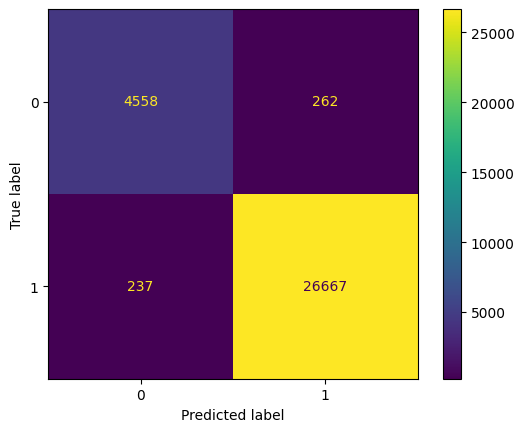

In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from mlxtend.classifier import StackingClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import lime.lime_tabular

# Load the dataset
dataset_path = '/content/Darknet_modified.csv'
df = pd.read_csv(dataset_path)

# Separate numeric and categorical columns
numeric_columns = df.select_dtypes(include=[np.number]).columns
categorical_columns = df.select_dtypes(exclude=[np.number]).columns

# Fill missing values for numeric columns with the mean of each column
df[numeric_columns] = df[numeric_columns].fillna(df[numeric_columns].mean())

# For categorical columns, fill missing values with the mode (most frequent value)
df[categorical_columns] = df[categorical_columns].fillna(df[categorical_columns].mode().iloc[0])

# Encode categorical columns (if any categorical columns are present)
le_categorical = LabelEncoder()
for col in categorical_columns:
    df[col] = le_categorical.fit_transform(df[col])

# Check for infinite values and replace them with NaN
df.replace([np.inf, -np.inf], np.nan, inplace=True)

# Fill NaN values again after replacing infinities, using the column mean for numeric columns
df[numeric_columns] = df[numeric_columns].fillna(df[numeric_columns].mean())

# Define features and target
features = [
    'Flow Duration', 'Total Fwd Packet', 'Total Bwd packets', 'Total Length of Fwd Packet',
    'Total Length of Bwd Packet', 'Fwd Packet Length Max', 'Fwd Packet Length Min',
    'Fwd Packet Length Mean', 'Fwd Packet Length Std', 'Bwd Packet Length Max',
    'Bwd Packet Length Min', 'Bwd Packet Length Mean', 'Bwd Packet Length Std',
    'Flow Bytes/s', 'Flow Packets/s', 'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max',
    'Flow IAT Min', 'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max',
    'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std', 'Bwd IAT Max',
    'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags', 'Fwd URG Flags', 'Bwd URG Flags',
    'Fwd Header Length', 'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s',
    'Packet Length Min', 'Packet Length Max', 'Packet Length Mean', 'Packet Length Std',
    'Packet Length Variance', 'FIN Flag Count', 'SYN Flag Count', 'RST Flag Count',
    'PSH Flag Count', 'ACK Flag Count', 'URG Flag Count', 'CWE Flag Count',
    'ECE Flag Count', 'Down/Up Ratio', 'Average Packet Size', 'Fwd Segment Size Avg',
    'Bwd Segment Size Avg', 'Fwd Bytes/Bulk Avg', 'Fwd Packet/Bulk Avg', 'Fwd Bulk Rate Avg',
    'Bwd Bytes/Bulk Avg', 'Bwd Packet/Bulk Avg', 'Bwd Bulk Rate Avg', 'Subflow Fwd Packets',
    'Subflow Fwd Bytes', 'Subflow Bwd Packets', 'Subflow Bwd Bytes', 'FWD Init Win Bytes',
    'Bwd Init Win Bytes', 'Fwd Act Data Pkts', 'Fwd Seg Size Min', 'Active Mean', 'Active Std',
    'Active Max', 'Active Min', 'Idle Mean', 'Idle Std', 'Idle Max', 'Idle Min'
]
target = 'security_status'

X = df[features]
y = df[target]

# Encode target column
le_target = LabelEncoder()
y = le_target.fit_transform(y)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define base models
xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss')
rf = RandomForestClassifier(random_state=42)
lr = LogisticRegression()

# Define stacking model
stack_model = StackingClassifier(
    classifiers=[xgb, rf],
    meta_classifier=lr
)

# Train the stacking model
stack_model.fit(X_train_scaled, y_train)

# Predictions
y_pred = stack_model.predict(X_test_scaled)

# Classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=le_target.classes_)
disp.plot()

# LIME Predictions
explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train_scaled,
    feature_names=features,
    class_names=le_target.classes_,
    discretize_continuous=True
)
i = 0  # Instance index (you can change this to any other index in the test set)
explanation = explainer.explain_instance(
    X_test_scaled[i],
    stack_model.predict_proba,
    num_features=10
)
explanation.show_in_notebook()


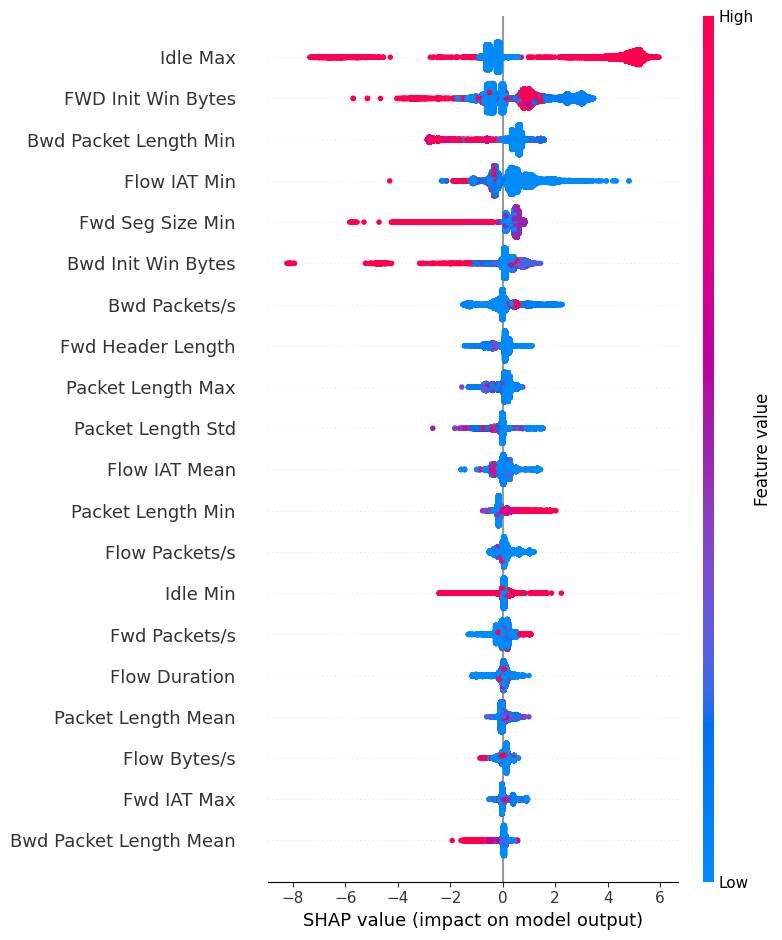

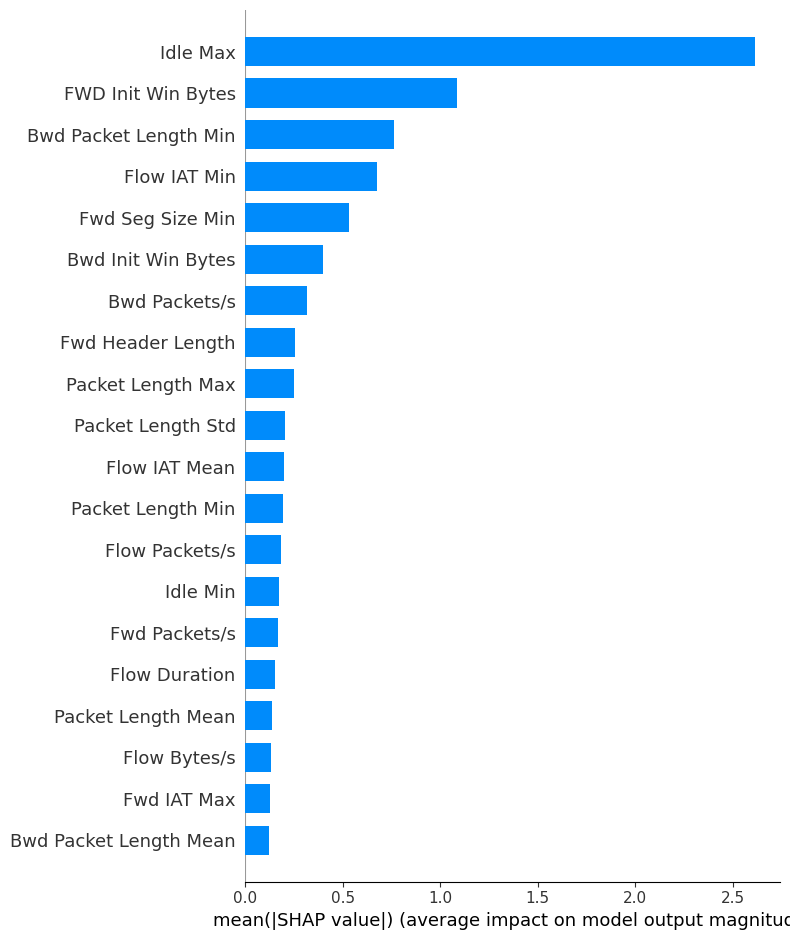

In [ ]:
import shap
import matplotlib.pyplot as plt

# Ensure SHAP JavaScript visualizations are enabled
shap.initjs()

# Initialize the SHAP explainer for the XGBoost model
explainer = shap.TreeExplainer(xgb)

# Compute SHAP values for the test set
shap_values = explainer.shap_values(X_test_scaled)

# Plot the feature importance
# Summary plot
shap.summary_plot(shap_values, X_test_scaled, feature_names=features)

# Bar plot for mean absolute SHAP values
shap.summary_plot(shap_values, X_test_scaled, feature_names=features, plot_type="bar")


In [ ]:
!pip install shap


# Stack Ensemble of RF, Decision tree , GCLR


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.94      0.94      4821
           1       0.99      0.99      0.99     26903

    accuracy                           0.98     31724
   macro avg       0.97      0.96      0.97     31724
weighted avg       0.98      0.98      0.98     31724



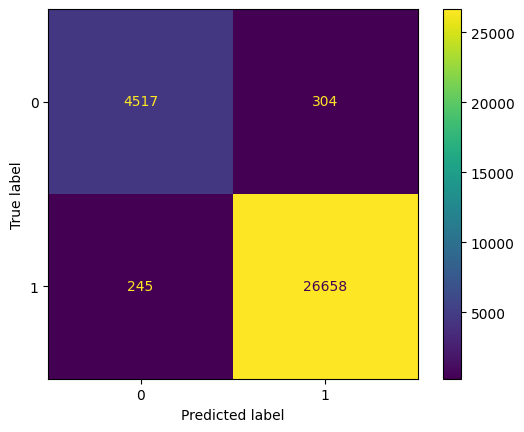

In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier  # Importing DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from mlxtend.classifier import StackingClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import lime.lime_tabular

# Load the dataset
dataset_path = '/content/Darknet_modified.csv'
df = pd.read_csv(dataset_path)

# Separate numeric and categorical columns
numeric_columns = df.select_dtypes(include=[np.number]).columns
categorical_columns = df.select_dtypes(exclude=[np.number]).columns

# Fill missing values for numeric columns with the mean of each column
df[numeric_columns] = df[numeric_columns].fillna(df[numeric_columns].mean())

# For categorical columns, fill missing values with the mode (most frequent value)
df[categorical_columns] = df[categorical_columns].fillna(df[categorical_columns].mode().iloc[0])

# Encode categorical columns (if any categorical columns are present)
le_categorical = LabelEncoder()
for col in categorical_columns:
    df[col] = le_categorical.fit_transform(df[col])

# Check for infinite values and replace them with NaN
df.replace([np.inf, -np.inf], np.nan, inplace=True)

# Fill NaN values again after replacing infinities, using the column mean for numeric columns
df[numeric_columns] = df[numeric_columns].fillna(df[numeric_columns].mean())

# Define features and target
features = [
    'Flow Duration', 'Total Fwd Packet', 'Total Bwd packets', 'Total Length of Fwd Packet',
    'Total Length of Bwd Packet', 'Fwd Packet Length Max', 'Fwd Packet Length Min',
    'Fwd Packet Length Mean', 'Fwd Packet Length Std', 'Bwd Packet Length Max',
    'Bwd Packet Length Min', 'Bwd Packet Length Mean', 'Bwd Packet Length Std',
    'Flow Bytes/s', 'Flow Packets/s', 'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max',
    'Flow IAT Min', 'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max',
    'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std', 'Bwd IAT Max',
    'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags', 'Fwd URG Flags', 'Bwd URG Flags',
    'Fwd Header Length', 'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s',
    'Packet Length Min', 'Packet Length Max', 'Packet Length Mean', 'Packet Length Std',
    'Packet Length Variance', 'FIN Flag Count', 'SYN Flag Count', 'RST Flag Count',
    'PSH Flag Count', 'ACK Flag Count', 'URG Flag Count', 'CWE Flag Count',
    'ECE Flag Count', 'Down/Up Ratio', 'Average Packet Size', 'Fwd Segment Size Avg',
    'Bwd Segment Size Avg', 'Fwd Bytes/Bulk Avg', 'Fwd Packet/Bulk Avg', 'Fwd Bulk Rate Avg',
    'Bwd Bytes/Bulk Avg', 'Bwd Packet/Bulk Avg', 'Bwd Bulk Rate Avg', 'Subflow Fwd Packets',
    'Subflow Fwd Bytes', 'Subflow Bwd Packets', 'Subflow Bwd Bytes', 'FWD Init Win Bytes',
    'Bwd Init Win Bytes', 'Fwd Act Data Pkts', 'Fwd Seg Size Min', 'Active Mean', 'Active Std',
    'Active Max', 'Active Min', 'Idle Mean', 'Idle Std', 'Idle Max', 'Idle Min'
]
target = 'security_status'

X = df[features]
y = df[target]

# Encode target column
le_target = LabelEncoder()
y = le_target.fit_transform(y)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define base models
rf = RandomForestClassifier(random_state=42)
dt = DecisionTreeClassifier(random_state=42)  # Replacing SVM with DecisionTreeClassifier
gclr = LogisticRegression(random_state=42)  # Using Logistic Regression as a Generalized Linear Classifier

# Define stacking model
stack_model = StackingClassifier(
    classifiers=[rf, dt, gclr],  # Replacing SVM with DecisionTreeClassifier
    meta_classifier=gclr  # Logistic Regression is used as the meta classifier
)

# Train the stacking model
stack_model.fit(X_train_scaled, y_train)

# Predictions
y_pred = stack_model.predict(X_test_scaled)

# Classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=le_target.classes_)
disp.plot()

# LIME Predictions
explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train_scaled,
    feature_names=features,
    class_names=le_target.classes_,
    discretize_continuous=True
)
i = 0  # Instance index (you can change this to any other index in the test set)
explanation = explainer.explain_instance(
    X_test_scaled[i],
    stack_model.predict_proba,
    num_features=10
)
explanation.show_in_notebook()


# Voting Classifier: XGB, LR, RF (Soft Voting)

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.96      0.89      4821
           1       0.99      0.97      0.98     26903

    accuracy                           0.97     31724
   macro avg       0.91      0.96      0.94     31724
weighted avg       0.97      0.97      0.97     31724



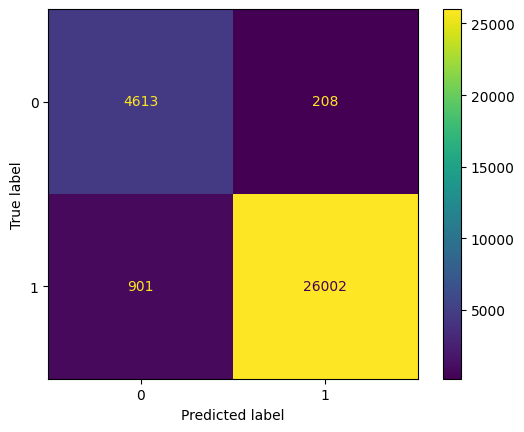

In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import lime.lime_tabular
from sklearn.exceptions import ConvergenceWarning  # Import ConvergenceWarning
import warnings

# Suppress the warnings for convergence issues
warnings.filterwarnings("ignore", category=ConvergenceWarning)

# Load the dataset
dataset_path = '/content/Darknet_modified.csv'
df = pd.read_csv(dataset_path)

# Separate numeric and categorical columns
numeric_columns = df.select_dtypes(include=[np.number]).columns
categorical_columns = df.select_dtypes(exclude=[np.number]).columns

# Fill missing values for numeric columns with the mean of each column
df[numeric_columns] = df[numeric_columns].fillna(df[numeric_columns].mean())

# For categorical columns, fill missing values with the mode (most frequent value)
df[categorical_columns] = df[categorical_columns].fillna(df[categorical_columns].mode().iloc[0])

# Encode categorical columns (if any categorical columns are present)
le_categorical = LabelEncoder()
for col in categorical_columns:
    df[col] = le_categorical.fit_transform(df[col])

# Check for infinite values and replace them with NaN
df.replace([np.inf, -np.inf], np.nan, inplace=True)

# Fill NaN values again after replacing infinities, using the column mean for numeric columns
df[numeric_columns] = df[numeric_columns].fillna(df[numeric_columns].mean())

# Define features and target
features = [
    'Flow Duration', 'Total Fwd Packet', 'Total Bwd packets', 'Total Length of Fwd Packet',
    'Total Length of Bwd Packet', 'Fwd Packet Length Max', 'Fwd Packet Length Min',
    'Fwd Packet Length Mean', 'Fwd Packet Length Std', 'Bwd Packet Length Max',
    'Bwd Packet Length Min', 'Bwd Packet Length Mean', 'Bwd Packet Length Std',
    'Flow Bytes/s', 'Flow Packets/s', 'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max',
    'Flow IAT Min', 'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max',
    'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std', 'Bwd IAT Max',
    'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags', 'Fwd URG Flags', 'Bwd URG Flags',
    'Fwd Header Length', 'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s',
    'Packet Length Min', 'Packet Length Max', 'Packet Length Mean', 'Packet Length Std',
    'Packet Length Variance', 'FIN Flag Count', 'SYN Flag Count', 'RST Flag Count',
    'PSH Flag Count', 'ACK Flag Count', 'URG Flag Count', 'CWE Flag Count',
    'ECE Flag Count', 'Down/Up Ratio', 'Average Packet Size', 'Fwd Segment Size Avg',
    'Bwd Segment Size Avg', 'Fwd Bytes/Bulk Avg', 'Fwd Packet/Bulk Avg', 'Fwd Bulk Rate Avg',
    'Bwd Bytes/Bulk Avg', 'Bwd Packet/Bulk Avg', 'Bwd Bulk Rate Avg', 'Subflow Fwd Packets',
    'Subflow Fwd Bytes', 'Subflow Bwd Packets', 'Subflow Bwd Bytes', 'FWD Init Win Bytes',
    'Bwd Init Win Bytes', 'Fwd Act Data Pkts', 'Fwd Seg Size Min', 'Active Mean', 'Active Std',
    'Active Max', 'Active Min', 'Idle Mean', 'Idle Std', 'Idle Max', 'Idle Min'
]
target = 'security_status'

X = df[features]
y = df[target]

# Encode target column
le_target = LabelEncoder()
y = le_target.fit_transform(y)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define base models
rf = RandomForestClassifier(random_state=42)
lr = LogisticRegression(random_state=42, max_iter=1000, solver='lbfgs')  # Increased max_iter

# Train the models separately
rf.fit(X_train_scaled, y_train)
lr.fit(X_train_scaled, y_train)

# Make predictions from both models
y_pred_rf = rf.predict(X_test_scaled)
y_pred_lr = lr.predict(X_test_scaled)

# Combine predictions (majority vote)
y_pred_combined = np.round((y_pred_rf + y_pred_lr) / 2).astype(int)

# Classification report
print("Classification Report:")
print(classification_report(y_test, y_pred_combined))

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred_combined)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=le_target.classes_)
disp.plot()

# LIME Predictions
explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train_scaled,
    feature_names=features,
    class_names=le_target.classes_,
    discretize_continuous=True
)
i = 0  # Instance index (you can change this to any other index in the test set)
explanation = explainer.explain_instance(
    X_test_scaled[i],
    rf.predict_proba,  # Can also use lr.predict_proba for Logistic Regression
    num_features=10
)
explanation.show_in_notebook()
